In [2]:
import numpy as np
import mediapy as media
from matplotlib import pyplot as plt

url = '/Users/odedvaalany/development/Intro To Image Proccessing/ex1/Exercise Inputs-20240106/video4_category2.mp4'
video = media.read_video(url)
video4D = np.asarray(video)
print(video4D.dtype)
videoGrays = np.floor(0.299*video4D[:, :, :, 0]+0.587 * video4D[:, :, :, 1]+0.114*video4D[:, :, :, 2]).astype(np.uint8)
# print(videoGrays)


uint8


Here I will configure the basic function that helps me to do some manipulations on the video

In [115]:
def video2Grays(video: np.array) -> np.array:
    return np.round(0.299*video[:, :, :, 0]+0.587 * video[:, :, :, 1]+0.114*video[:, :, :, 2]).astype(np.uint8)

def videoToHistograms(video: np.array,toCum : bool = False) -> np.array:
    rangeVals = np.arange(257)
    dens = np.zeros((video.shape[0], 256), dtype='float')
    for i in range(video.shape[0]):
        dens[i, :] = np.histogram(video[i], bins=rangeVals,density=True)[0]
    if toCum:
        return np.cumsum(dens,axis=1)
    return dens


In [94]:
grayScalesVideo = video2Grays(video4D)
media.show_video(grayScalesVideo)

Lets see some statistics to choose the best practice

In [95]:
cumHistogram = videoToHistograms(grayScalesVideo,True)
histogram = videoToHistograms(grayScalesVideo,False)

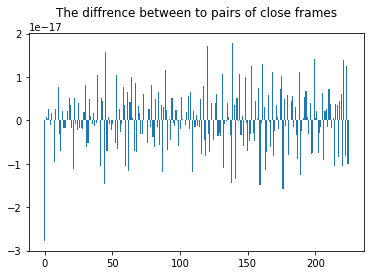

In [96]:
#distance between 2 close frames
x = np.arange(grayScalesVideo.shape[0]) # number of frames
y = np.sum(histogram - np.roll(histogram,1,axis=0),axis=1)
plt.bar(x,y)
plt.title("The diffrence between to pairs of close frames")
plt.show()


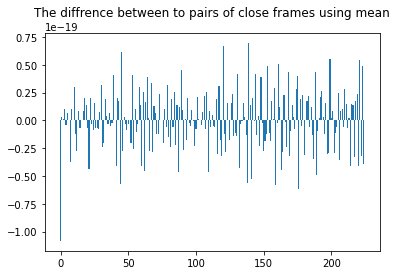

In [97]:
#distance between frame with their means
y = np.mean(histogram - np.roll(histogram,1,axis=0),axis=1)
plt.bar(x,y)
plt.title("The diffrence between to pairs of close frames using mean")
plt.show()

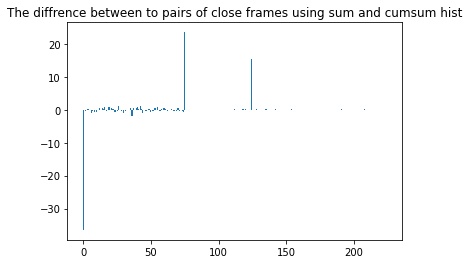

In [98]:
#using the cumsom histogram 
y = np.sum(cumHistogram - np.roll(cumHistogram,1,axis=0),axis=1)
plt.bar(x,y)
plt.title("The diffrence between to pairs of close frames using sum and cumsum hist")
plt.show()

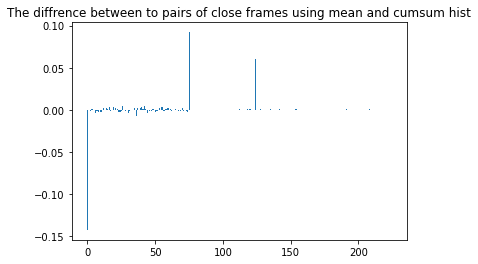

IndexError: index 257 is out of bounds for axis 0 with size 225

In [99]:
#using cumsom histogram with mean val
#using the cumsom histogram 
y = np.mean(cumHistogram - np.roll(cumHistogram,1,axis=0),axis=1)
plt.bar(x,y)
plt.title("The diffrence between to pairs of close frames using mean and cumsum hist")
plt.show()
np.argmax(y[1:])
y[257]
y[175]

uint8


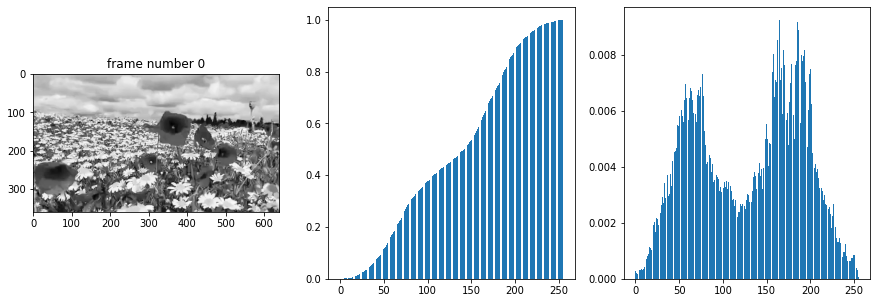

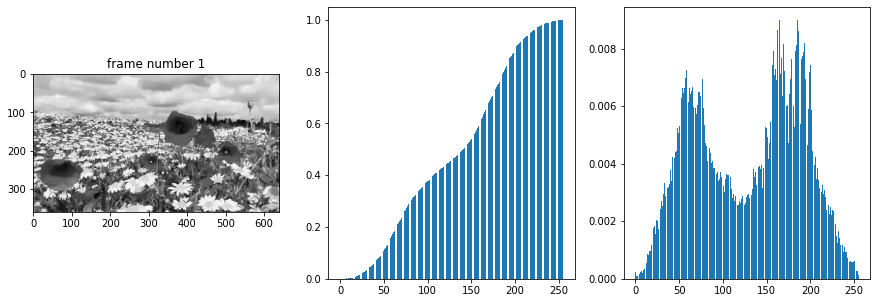

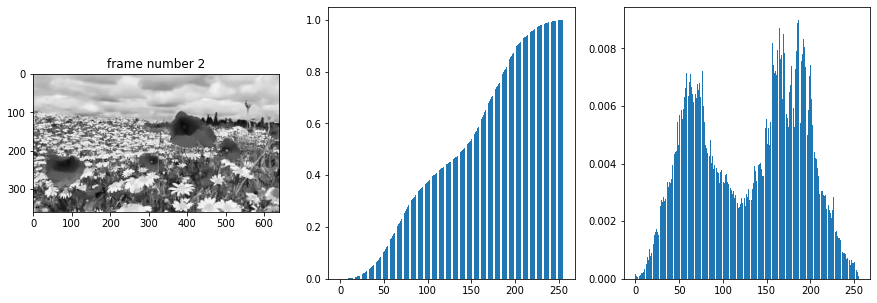

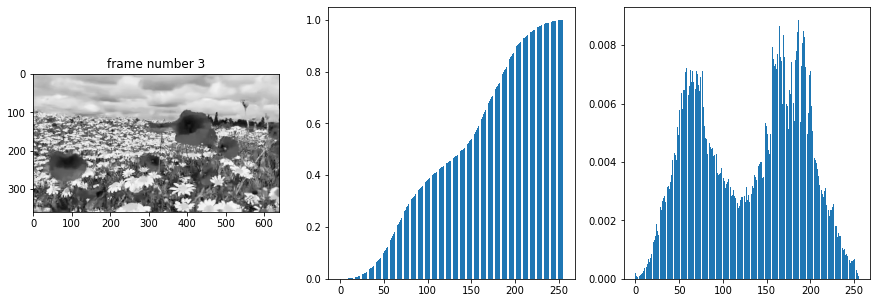

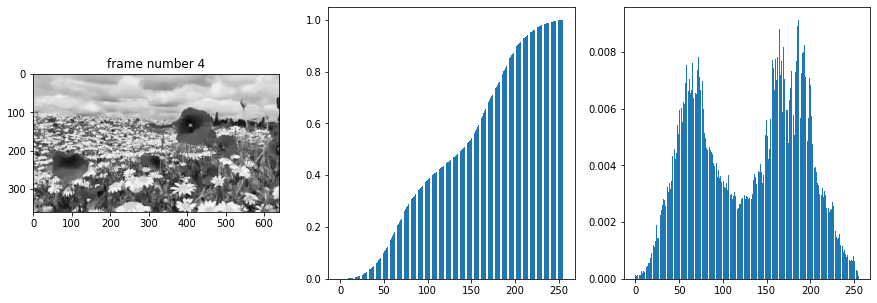

...

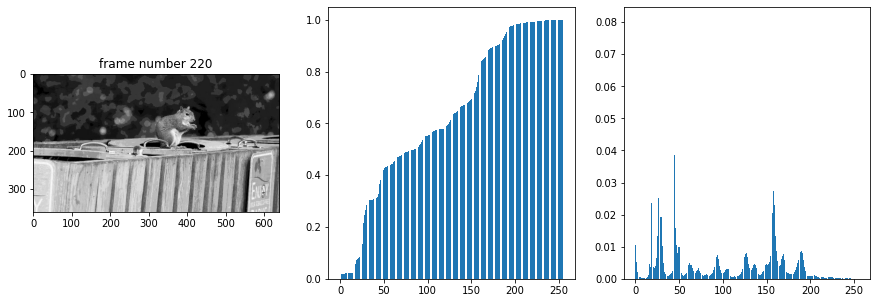

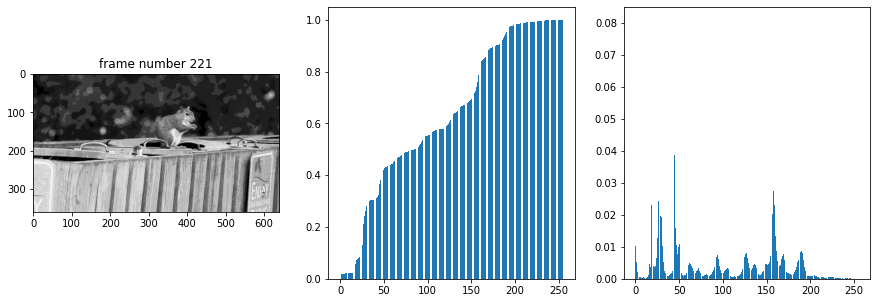

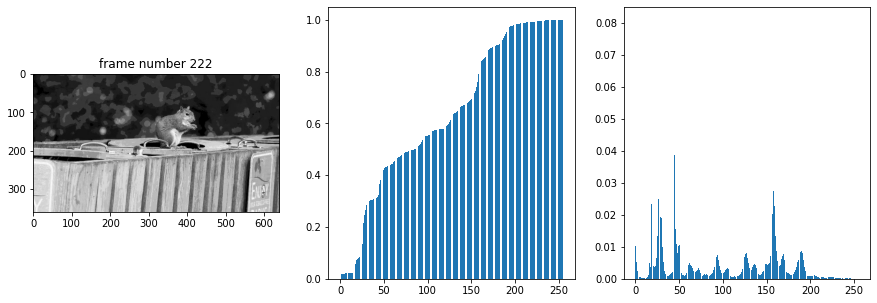

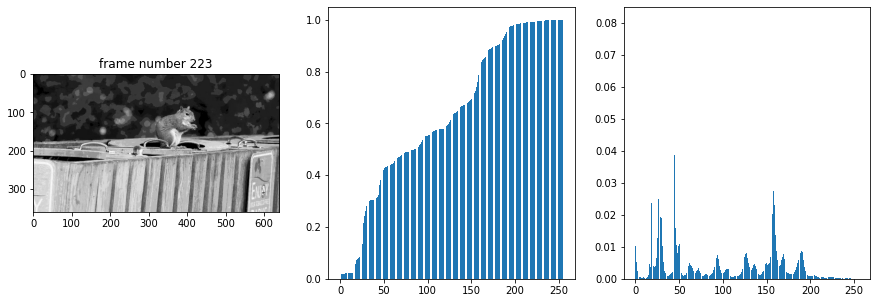

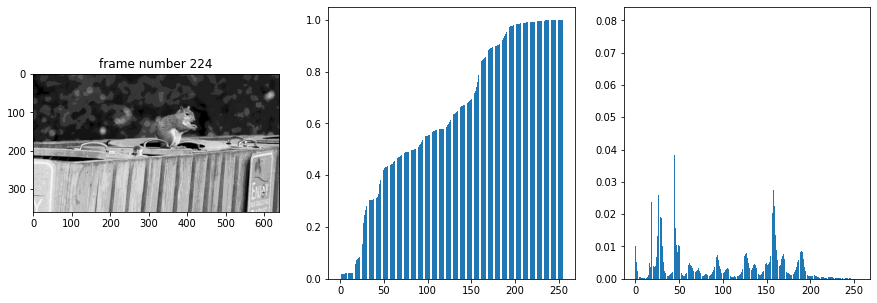

In [100]:
#plot all the frames of the video 2 category 2 
url = "/Users/odedvaalany/development/Intro To Image Proccessing/ex1/Exercise Inputs-20240106/video4_category2.mp4"
video = media.read_video(url)
video4D = np.asarray(video)
print(video4D.dtype)
videoGrays = np.floor(0.299*video4D[:, :, :, 0]+0.587 * video4D[:, :, :, 1]+0.114*video4D[:, :, :, 2]).astype(np.uint8)
for i in range(videoGrays.shape[0]):
    figure, axis = plt.subplots(1,3)
    figure.set_figwidth(15)
    figure.set_figheight(5)
    axis[0].imshow(255-videoGrays[i],cmap='Grays')
    axis[0].title.set_text(f'frame number {i}')
    axis[1].bar(np.arange(cumHistogram[i].shape[0]),cumHistogram[i])
    axis[2].bar(np.arange(histogram[i].shape[0]),histogram[i])
    plt.show()


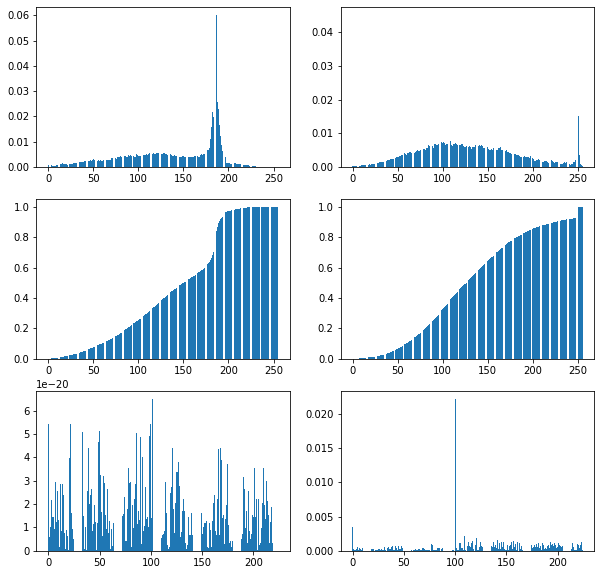

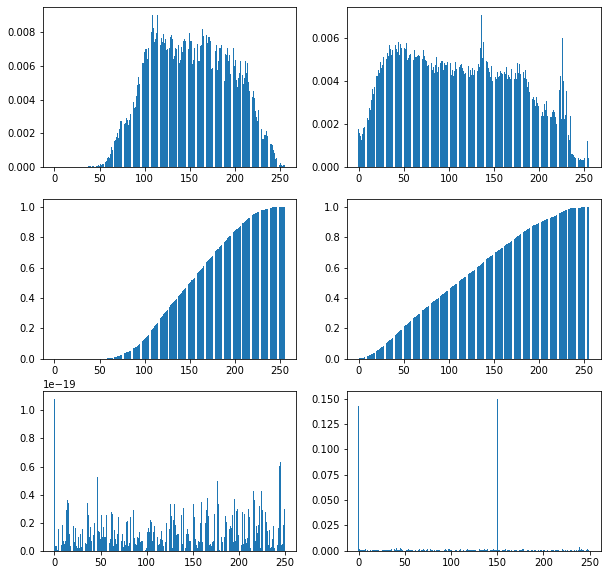

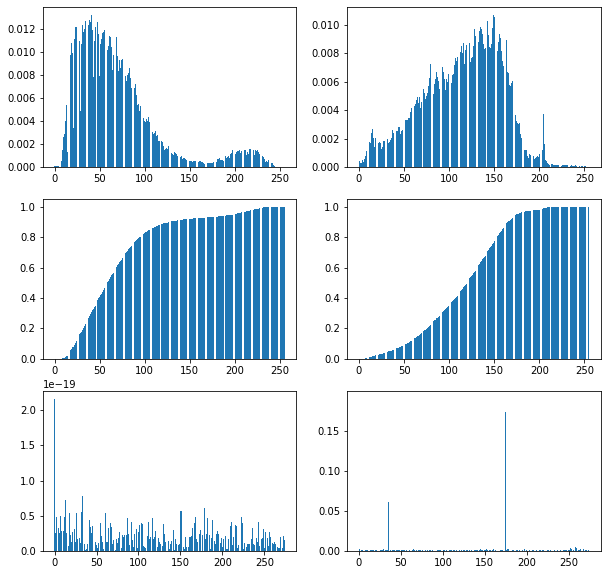

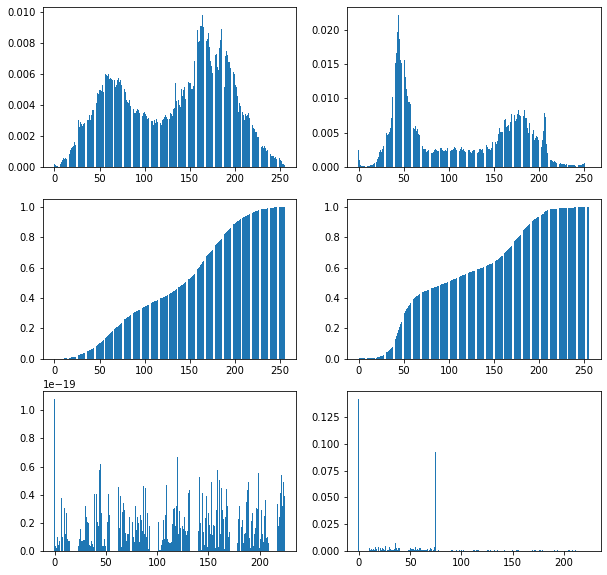

In [124]:
urls = ['/Users/odedvaalany/development/Intro To Image Proccessing/ex1/Exercise Inputs-20240106/video1_category1.mp4'
,'/Users/odedvaalany/development/Intro To Image Proccessing/ex1/Exercise Inputs-20240106/video2_category1.mp4'
,'/Users/odedvaalany/development/Intro To Image Proccessing/ex1/Exercise Inputs-20240106/video3_category2.mp4'
,'/Users/odedvaalany/development/Intro To Image Proccessing/ex1/Exercise Inputs-20240106/video4_category2.mp4']
cuts = [[99,100],[149,150],[174,175],[74,75]]

for i in range(4):
    img1= media.read_video(urls[i])   
    video4D = np.asarray(img1)
    grays = video2Grays(video4D)
    figure,axis = plt.subplots(3,2)
    histogram = videoToHistograms(grays,False)
    cumHistogram = videoToHistograms(grays,True)
    figure.set_figwidth(10)
    figure.set_figheight(10)
    axis[0,0].bar(np.arange(cumHistogram[0].shape[0]),histogram[cuts[i][0]])
    axis[0,1].bar(np.arange(cumHistogram[0].shape[0]),histogram[cuts[i][1]])
    axis[1,0].bar(np.arange(cumHistogram[0].shape[0]),cumHistogram[cuts[i][0]])
    axis[1,1].bar(np.arange(cumHistogram[0].shape[0]),cumHistogram[cuts[i][1]])
    axis[2,0].bar(np.arange(histogram.shape[0]),np.abs(np.mean(histogram - np.roll(histogram, 1, axis=0),axis=1)))
    axis[2,1].bar(np.arange(cumHistogram.shape[0]),np.abs(np.mean(cumHistogram - np.roll(cumHistogram, 1, axis=0),axis=1)))
    plt.show(f'this is fig')

In [7]:
url1 = "/Users/odedvaalany/development/Intro To Image Proccessing/ex1/vids/video3_category2.mp4"
url2 = "/Users/odedvaalany/development/Intro To Image Proccessing/ex1/vids/video4_category2.mp4"

vid1 = np.asarray(media.read_video(url1))
vid2 = np.asarray(media.read_video(url2))
newVid1 = np.concatenate((vid1[:175],vid2[75:]),axis=0)
media.write_video("/Users/odedvaalany/development/Intro To Image Proccessing/ex1/vids/video7_category2.mp4",newVid1,fps=60)
newVid2 = np.concatenate((vid2[:75],vid1[175:]),axis=0)
media.write_video("/Users/odedvaalany/development/Intro To Image Proccessing/ex1/vids/video8_category2.mp4",newVid2,fps=60)
